In [ ]:
#Unziping the files
#!unzip "drive/MyDrive/Colab Notebooks/Dog vision/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/Dog vision"

## Get our workspace ready

In [ ]:
#import
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd
print("Tensorflow version:",tf.__version__)
print("Hub version:",hub.__version__)

Tensorflow version: 2.17.0
Hub version: 0.16.1


In [ ]:
#checking the availability of the GPU
print("GPU","available (YES)!!!"if tf.config.list_physical_devices("GPU") else "GPU not available")

GPU available (YES)!!!


In [ ]:
df=pd.read_csv("drive/MyDrive/Colab Notebooks/Dog vision/labels.csv")

In [ ]:
print(df.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     fff43b07992508bc822f33d8ffd902ae  scottish_deerhound
freq                                   1                 126


In [ ]:
print(df.head())

                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


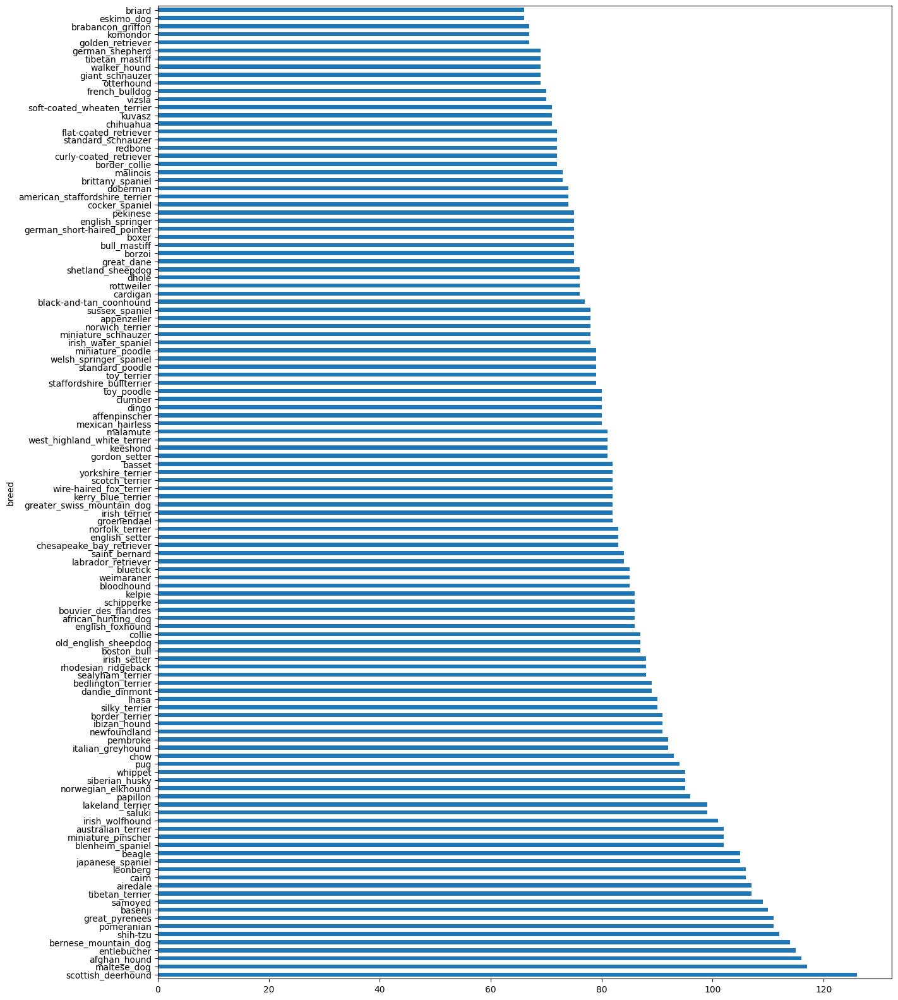

In [ ]:
df["breed"].value_counts().plot.barh(figsize=(15,20));

In [ ]:
df["breed"].value_counts().median()

82.0

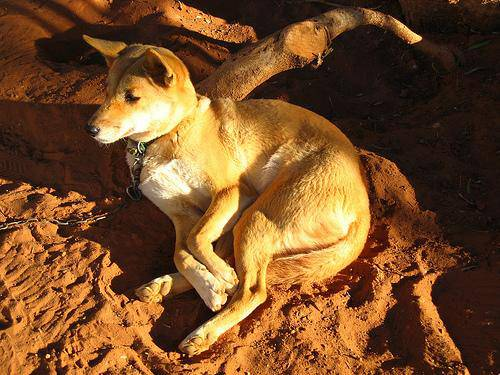

In [ ]:
from IPython.display import Image
Image("drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

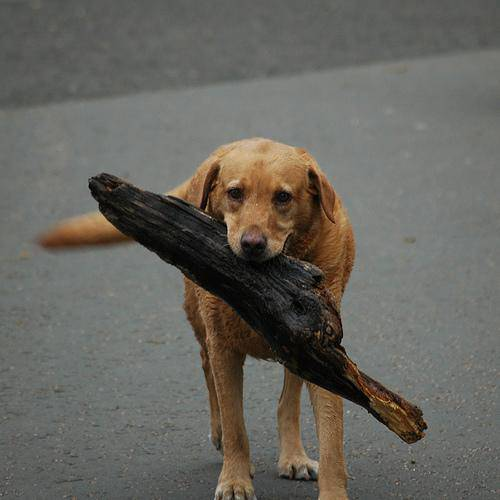

In [ ]:
Image("drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")

In [ ]:
# looping the every files in the images of the train
filenames=["drive/MyDrive/Colab Notebooks/Dog vision/train/"+i+".jpg" for i in df["id"]]
filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# checking the size
import os
if(len(os.listdir("drive/MyDrive/Colab Notebooks/Dog vision/train"))==len(filenames)):
    print("Size matched")
else:
   print("Size unmatched")

Size matched


In [ ]:
df["breed"][9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels=np.array(df["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
#checking the length of the labels and the filenames
if(len(labels)==len(filenames)):
    print("Matched")
else:
    print("Unmatched")

Matched


In [ ]:
len(labels),len(filenames)

(10222, 10222)

In [ ]:
#going to identify the unique breeds
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
#Turning single label into array of boolean
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turning all labels into array of booleans
print(labels[:10])
boolean_labels= [label==unique_breeds for label in labels]
boolean_labels[:2]

['boston_bull' 'dingo' 'pekinese' 'bluetick' 'golden_retriever'
 'bedlington_terrier' 'bedlington_terrier' 'borzoi' 'basenji'
 'scottish_deerhound']


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
#turning boolean vales into numbers
print(labels[0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
#split x and y
x= filenames
y= boolean_labels

In [ ]:
#set up the number of the images for the experimentation
NUM_IMAGES= 1000 #@param {type:"slider",min:1000,max:10000,step:1000}
NUM_IMAGES

1000

In [ ]:
#import the model to split
from sklearn.model_selection import train_test_split

#set up random seed
np.random.seed(42)

#spliting the data into train and valid
x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

#length of every sets
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:5],y_train[:2]

(['drive/MyDrive/Colab Notebooks/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Colab Notebooks/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False,

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
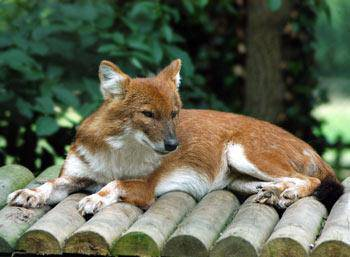

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image

In [ ]:
image.shape

(257, 350, 3)

In [ ]:
image.min(),image.max()

(0, 255)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
#preproccessing the data
#defining the image size
IMG_SIZE= 224

#Creating a function to preprocess the data
def preprocess_image(img_path,img_size=IMG_SIZE):
    #read the image
    image=tf.io.read_file(img_path)
    #converting the jpeg image into tensor numerical vales as RGB
    image=tf.image.decode_jpeg(image,channels=3)
    #converting the data type into float
    image=tf.image.convert_image_dtype(image,tf.float32)
    #resize the image
    image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])
    return image

In [ ]:
#simple function to retun image and label in the form of tuples
def get_image_label(img_path,label):
    image=preprocess_image(img_path)
    return image,label

In [ ]:
(preprocess_image(x[42]),y[42])

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
#defining the batch size
BATCH_SIZE=32

#creating a function to turn the data into the batches
def create_data_batch(x=x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):

    #test dataset
    if test_data:
        print("Creating the test dataset!")
        data=tf.data.Dataset.from_tensor_slices(tf.constant(x))
        data_batch=data.map(preprocess_image).batch(BATCH_SIZE)
        return data_batch

    #valid dataset
    elif valid_data:
        print("Creating the valid dataset!")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                 tf.constant(y)))
        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch

    #training dataset
    else:
        print("Creating the training dataset!")
        data=tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                                 tf.constant(y)))
        #shuffle
        data=data.shuffle(buffer_size=len(labels))
        #batch
        data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
#creating the train dataset and valid dataset
train_data= create_data_batch(x_train,y_train)
valid_data= create_data_batch(x_val,y_val,valid_data=True)

Creating the training dataset!
Creating the valid dataset!


In [ ]:
train_data.element_spec,valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
#import
import matplotlib.pyplot as plt
#creating a function to plot the train and valid dataset
def plot_image(images,labels):
    #figure size
    plt.figure(figsize=(10,10))

    for i in range(25):
        ax=plt.subplot(5,5,i+1)
        plt.imshow(images[i])
        plt.title(unique_breeds[labels[i].argmax()])
        plt.axis("off")

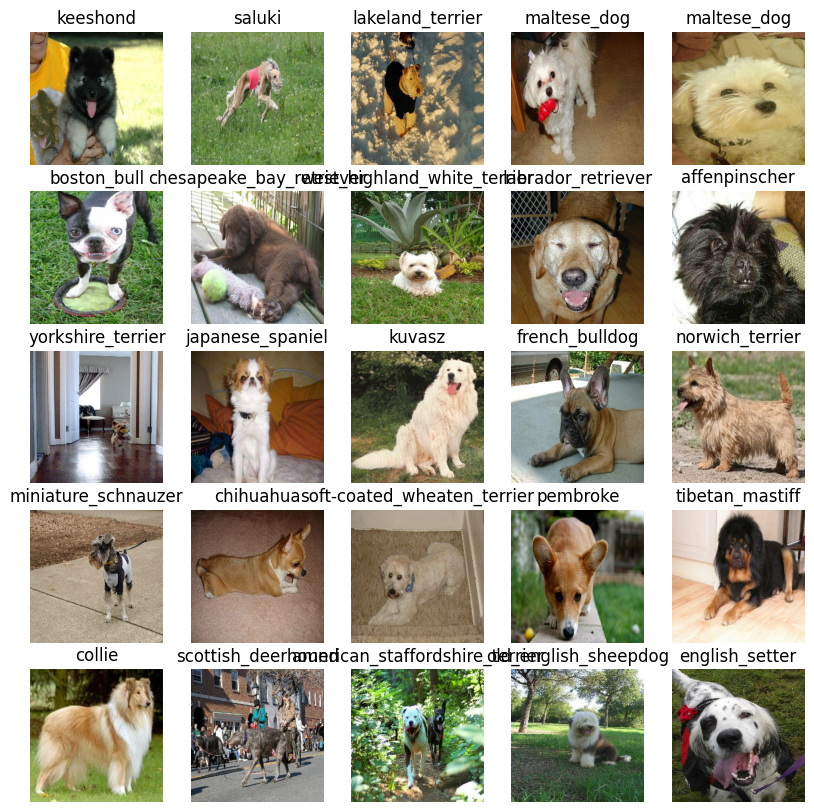

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())
plot_image(train_images,train_labels)

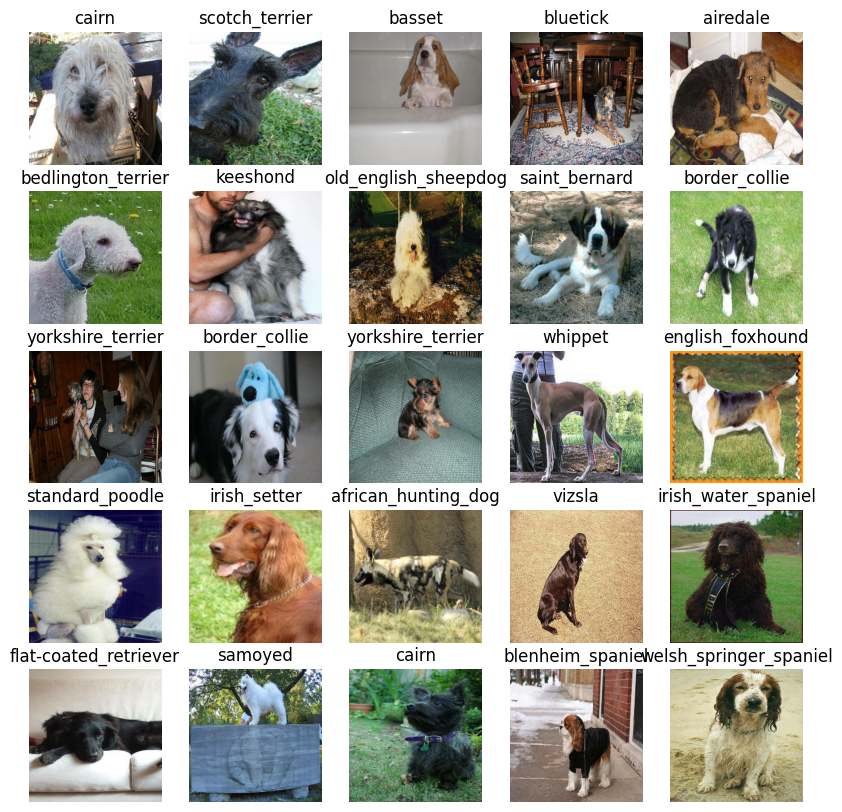

In [ ]:
valid_images,valid_labels= next(valid_data.as_numpy_iterator())
plot_image(valid_images,valid_labels)

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#Before building the machine learning model we have to done some three steps
img_size=224
input_shape=(None,img_size,img_size,3) #batch,height,width,channel
output_shape=(len(unique_breeds))
url="https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tf_keras

def create_model(input_shape=input_shape, output_shape=output_shape, url=url):
    print("Building model with:", url)

    # Set up the model layer
    model = tf_keras.Sequential([
        hub.KerasLayer(url),
        tf_keras.layers.Dense(units=output_shape, activation="softmax")
    ])

    # Compile the model
    model.compile(
        loss=tf_keras.losses.CategoricalCrossentropy(),
        optimizer=tf_keras.optimizers.Adam(),
        metrics=["accuracy"]
    )
    #build the model
    model.build(input_shape)

    return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1280)              4049564   
                                                                 
 dense (Dense)               (None, 120)               153720    
                                                                 
Total params: 4203284 (16.03 MB)
Trainable params: 153720 (600.47 KB)
Non-trainable params: 4049564 (15.45 MB)
_________________________________________________________________


In [ ]:
output=np.ones(shape=(1,1,1280))
output

array([[[1., 1., 1., ..., 1., 1., 1.]]])

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime

#create a function to call the tensorboard callback
def create_tensorboard_callback():
    logdir=os.path.join("drive/MyDrive/Colab Notebooks/Dog vision/logs",
                        datetime.datetime.now().strftime("%y%m%d-%h%m%s"))
    return tf_keras.callbacks.TensorBoard(logdir)

In [ ]:
#Early stopping
early_stopping=tf_keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                patience=3)

In [ ]:
NUM_EPOCHS=100 #@param {type:'slider',min:100,max:1000}

In [ ]:
#function to train the model

def train_model():
    #create
    model=create_model()
    #TensorBoard
    tensorboard=create_tensorboard_callback()

    #fit the model
    model.fit(x=train_data,
              epochs=NUM_EPOCHS,
              validation_data=valid_data,
              validation_freq=1,
              callbacks=[tensorboard,early_stopping])

    return model

train_model=train_model()

Building model with: https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1
Epoch 1/100
25/25 [==============================] - 193s 5s/step - loss: 4.2933 - accuracy: 0.1625 - val_loss: 3.6755 - val_accuracy: 0.3700
Epoch 2/100
25/25 [==============================] - 4s 172ms/step - loss: 2.6131 - accuracy: 0.6675 - val_loss: 2.7114 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 4s 144ms/step - loss: 1.5577 - accuracy: 0.8450 - val_loss: 2.1147 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 152ms/step - loss: 0.9553 - accuracy: 0.9350 - val_loss: 1.7520 - val_accuracy: 0.6500
Epoch 5/100
25/25 [==============================] - 5s 217ms/step - loss: 0.6281 - accuracy: 0.9688 - val_loss: 1.5433 - val_accuracy: 0.6850
Epoch 6/100
25/25 [==============================] - 4s 142ms/step - loss: 0.4444 - accuracy: 0.9825 - val_loss: 1.4034 - val_accuracy: 0.6850
Epoch 7/100
25/25 [==============================] - 4s 147m

In [ ]:
%tensorboard --logdir "/content/drive/MyDrive/Colab Notebooks/Dog vision/logs"

<IPython.core.display.Javascript object>

# Making and Evaluating the predictions using a trained model

In [ ]:
# make predictions on the valid data set
valid_predictions = train_model.predict(valid_data, verbose=1)
valid_predictions

7/7 [==============================] - 2s 110ms/step


array([[2.7506379e-03, 1.9349610e-04, 5.6810735e-04, ..., 2.7942419e-04,
        3.4751842e-04, 1.0641087e-02],
       [1.0231028e-02, 8.5045962e-04, 3.5382141e-03, ..., 1.1182424e-03,
        2.3654785e-03, 1.5772993e-04],
       [3.0494345e-04, 5.5710209e-04, 1.4251716e-04, ..., 3.3824527e-04,
        4.1499746e-04, 4.9713481e-04],
       ...,
       [2.0932181e-04, 2.2607243e-04, 6.6847622e-04, ..., 3.0309369e-04,
        2.7732167e-04, 1.2447716e-03],
       [7.6458871e-04, 1.1107827e-04, 2.5911856e-04, ..., 3.0003604e-04,
        2.9063871e-04, 3.4235129e-03],
       [5.6617690e-04, 8.6556356e-05, 8.5102185e-04, ..., 1.9995871e-03,
        5.9450098e-04, 1.9653194e-04]], dtype=float32)

In [ ]:
valid_predictions.shape

(200, 120)

In [ ]:
np.sum(valid_predictions[0])

1.0000001

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
index=0
print(f"Max value (probability of predictions) {np.max(valid_predictions[index])}")
print(f"Sum: {np.sum(valid_predictions[index])}")
print(f"Max index:{np.argmax(valid_predictions[index])}")
print(f"Predicted label:{unique_breeds[np.argmax(valid_predictions[index])]}")

Max value (probability of predictions) 0.468214213848114
Sum: 1.0000001192092896
Max index:26
Predicted label:cairn


In [ ]:
unique_breeds[26]

'cairn'

In [ ]:
def get_pred_label(prediction_probabilities):
    return unique_breeds[np.argmax(prediction_probabilities)]
pred_label=get_pred_label(valid_predictions[0])
pred_label

'cairn'

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
#function to unbatch the dataset
def unbatchify(data):
    images=[]
    labels=[]
    for i,j in data.unbatch().as_numpy_iterator():
        images.append(i)
        labels.append(unique_breeds[np.argmax(j)])
    return images,labels

In [ ]:
#unbatchify the valid data
valid_images,valid_labels=unbatchify(valid_data)
valid_images[0],valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
images=[]
labels=[]
for i,j in valid_data.unbatch().as_numpy_iterator():
    images.append(i)
    labels.append(j)
images[0],labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(valid_predictions[81])

'irish_setter'

In [ ]:
get_pred_label(labels[81])

'irish_setter'

In [ ]:
#plot the predicted label
def plot_pred(prediction_probabilities , labels, images, n=1):
    pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

    #get the pred label
    pred_label=get_pred_label(pred_prob)

    #plot image & remove tickle
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    #change the color if predict is correct green color else red color
    if pred_label==true_label:
        color="green"
    else:
        color="red"
    #set title
    plt.title("{} {:2.0f}% {}".format(pred_label,
                                     np.max(pred_prob)*100,
                                     true_label),
                                     color=color)

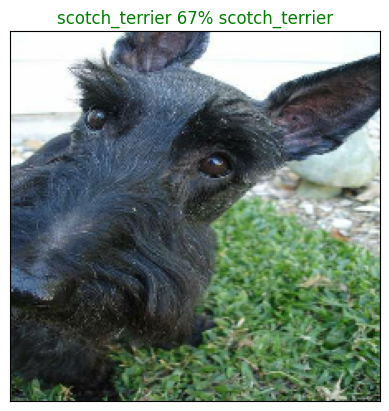

In [ ]:
plot_pred(prediction_probabilities=valid_predictions,
          labels=valid_labels,
          images=valid_images)

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n):
    pred_prob,true_label=prediction_probabilities[n],labels[n]

    #get the pred label
    pred_label=get_pred_label(pred_prob)
    #find the top 10 predictions
    top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]
    #find the top 10 labels
    top_10_labels=unique_breeds[top_10_pred_indexes]
    #find the top 10 prediction probability
    top_10_probs=pred_prob[top_10_pred_indexes]
    #setup plot
    top_plot=plt.bar(np.arange(len(top_10_labels)),
                     top_10_probs,
                     color="grey")
    plt.xticks(np.arange(len(top_10_labels)),
               labels=top_10_labels,
               rotation="vertical")
    #change the color of the label according to the prediction
    if np.isin(true_label,top_10_labels):
        top_plot[np.argmax(top_10_labels==true_label)].set_color("green")
    else:
        pass

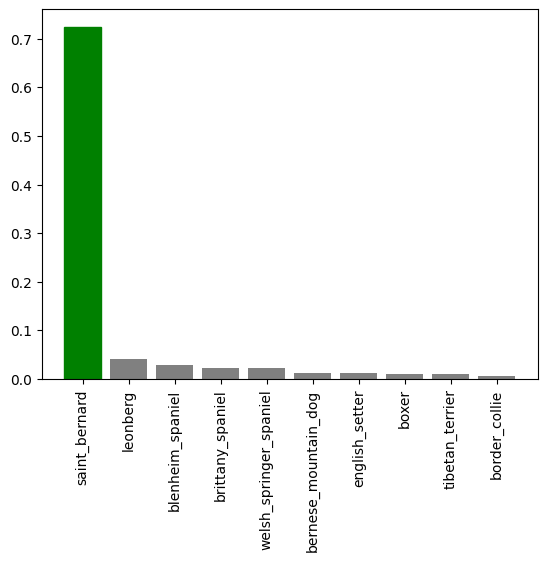

In [ ]:
plot_pred_conf(prediction_probabilities=valid_predictions,
               labels=valid_labels,
               n=8)

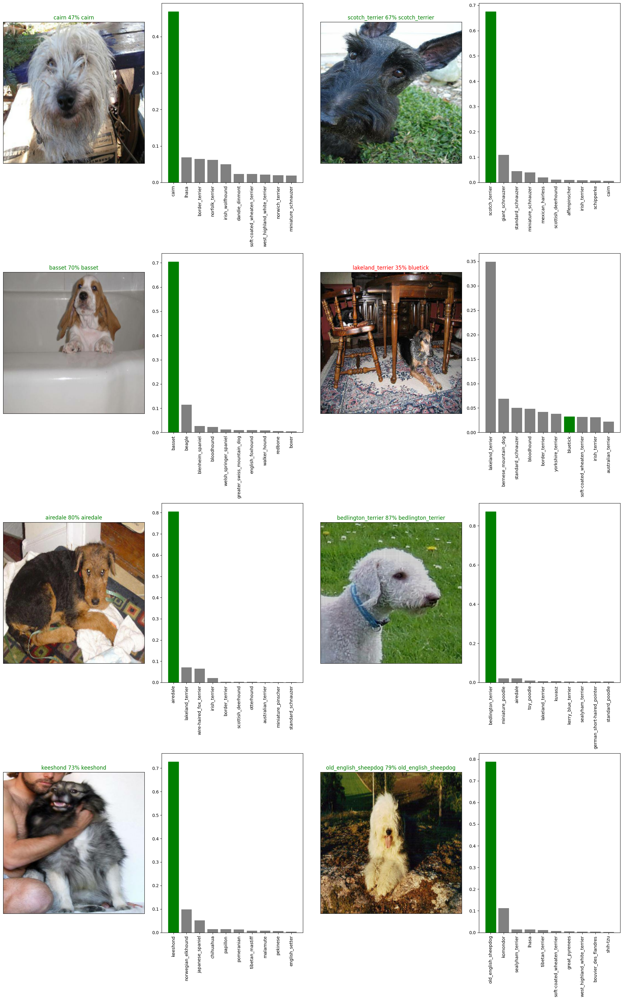

In [ ]:
#few predictions and different values
i_multiplier=0
num_rows=4
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*2,8*num_rows))
for i in range(num_images):
    plt.subplot(num_rows,2*num_cols,2*i+1)
    plot_pred(prediction_probabilities=valid_predictions,
              labels=valid_labels,
              images=valid_images,
              n=i+i_multiplier)
    plt.subplot(num_rows,2*num_cols,2*i+2)
    plot_pred_conf(prediction_probabilities=valid_predictions,
                   labels=valid_labels,
                   n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
#full data
full_data=create_data_batch(x,y)
full_data

Creating the training dataset!


<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#create a model for the full dataset
full_model=create_model()

Building model with: https://tfhub.dev/tensorflow/efficientnet/b0/feature-vector/1


In [ ]:
#create full model callback
full_model_tensorboard=create_tensorboard_callback()
#early staopping
full_model_early_stopping=tf_keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 64s 155ms/step - loss: 1.5086 - accuracy: 0.6961
Epoch 2/100
320/320 [==============================] - 43s 134ms/step - loss: 0.4812 - accuracy: 0.8808
Epoch 3/100
320/320 [==============================] - 43s 134ms/step - loss: 0.3332 - accuracy: 0.9223
Epoch 4/100
320/320 [==============================] - 43s 134ms/step - loss: 0.2523 - accuracy: 0.9439
Epoch 5/100
320/320 [==============================] - 43s 134ms/step - loss: 0.1975 - accuracy: 0.9596
Epoch 6/100
320/320 [==============================] - 42s 131ms/step - loss: 0.1586 - accuracy: 0.9696
Epoch 7/100
320/320 [==============================] - 42s 132ms/step - loss: 0.1287 - accuracy: 0.9788
Epoch 8/100
320/320 [==============================] - 45s 140ms/step - loss: 0.1061 - accuracy: 0.9851
Epoch 9/100
320/320 [==============================] - 45s 141ms/step - loss: 0.0886 - accuracy: 0.9882
Epoch 10/100
320/320 [==============================] - 41s 129m

In [ ]:
#saving the model
full_model.save("drive/MyDrive/Colab Notebooks/Dog vision/models/full_model.h5")

/usr/local/lib/python3.10/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
#reload the trained model
full_model_loaded=tf_keras.models.load_model("drive/MyDrive/Colab Notebooks/Dog vision/models/full_model.h5",
                                             custom_objects={"KerasLayer":hub.KerasLayer})

In [ ]:
#Evaluate the pre saved model
model.evaluate(valid_data)

7/7 [==============================] - 3s 162ms/step - loss: 4.8839 - accuracy: 0.0050


[4.883939266204834, 0.004999999888241291]

In [ ]:
#Evaluate the loaded model
full_model_loaded.evaluate(valid_data)

7/7 [==============================] - 4s 169ms/step - loss: 0.0100 - accuracy: 1.0000


[0.01002105325460434, 1.0]

In [ ]:
#load the test images
test_path="drive/MyDrive/Colab Notebooks/Dog vision/test"
test_filenames=[test_path+"/"+i for i in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Colab Notebooks/Dog vision/test/eb2f2ad0f785a7c85f8c62969be71e2a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/f58ce44146db339a0bba50bcecb02730.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e8f51d54d179b05ea4cc9c726cae9229.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/f4a3d9cf1909fb5d894ff5d5121af9b0.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/e92e6f99e804a6696cf0db266bbd7744.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/f592d6ca12a9d99c18f26260c3eb148a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/f4bfd6652f7cb8d9e99c7771ba29ab8a.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/ea5a0fb0d92c07b2e14da4dcd0d48c45.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/eaa65260eb9a2f7d3b5484ac97962788.jpg',
 'drive/MyDrive/Colab Notebooks/Dog vision/test/ed0b66d283d948128c45ce57478ba048.jpg']

In [ ]:
len(test_filenames)

10357